In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()


import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

from wordcloud import WordCloud, STOPWORDS

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

from iso3166 import countries

In [2]:
april_df = pd.read_csv('E:/Project 5 credits/Final Project/April 2020/april tweets.csv',lineterminator='\n')
april_df.head()

,Unnamed: 0,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang\r
0,0,1255285670781878275,1244488571026690048,2020-04-29T00:00:00Z,NikoledMX,Las solicitudes de hospitales y otras organiza...,TweetDeck,NaN,NaN,NaN,...,0,NaN,NaN,NaN,3,25,NaN,2020-03-30T04:56:21Z,False,es\r
1,1,1255285670182113282,817072420947247104,2020-04-29T00:00:00Z,Tu_IMSS_Coah,Prepara tu propio gel antibacterial es fácil ...,TweetDeck,NaN,NaN,NaN,...,0,NaN,NaN,NaN,1710,169,NaN,2017-01-05T18:17:00Z,False,es\r
2,2,1255285669259292673,184827671,2020-04-29T00:00:00Z,AntenaSanLuis,"Por más terror que cause, la apocalíptica rela...",TweetDeck,NaN,NaN,NaN,...,0,NaN,NaN,NaN,122908,4370,NaN,2010-08-30T15:47:01Z,False,es\r
3,3,1255285669888438272,82608449,2020-04-29T00:00:00Z,DiarioPresente,Panorama en #Tabasco de casos de #COVID19 #Ent...,TweetDeck,NaN,NaN,NaN,...,3,NaN,NaN,NaN,145940,3116,NaN,2009-10-15T12:46:02Z,False,es\r
4,4,1255285670903496707,1042498579909107712,2020-04-29T00:00:00Z,ContraReplicaMX,#Francia comenzará a levantar las medidas de c...,TweetDeck,NaN,NaN,NaN,...,1,NaN,NaN,NaN,13548,2553,NaN,2018-09-19T19:40:04Z,False,es\r


In [3]:
april_df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            100000 non-null  int64  
 1   status_id             100000 non-null  int64  
 2   user_id               100000 non-null  int64  
 3   created_at            100000 non-null  object 
 4   screen_name           100000 non-null  object 
 5   text                  100000 non-null  object 
 6   source                99999 non-null   object 
 7   reply_to_status_id    12030 non-null   float64
 8   reply_to_user_id      14587 non-null   float64
 9   reply_to_screen_name  14587 non-null   object 
 10  is_quote              100000 non-null  bool   
 11  is_retweet            100000 non-null  bool   
 12  favourites_count      100000 non-null  int64  
 13  retweet_count         100000 non-null  int64  
 14  country_code          4409 non-null    object 
 15  p

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [4]:
april_df.describe()

,Unnamed: 0,status_id,user_id,reply_to_status_id,reply_to_user_id,favourites_count,retweet_count,followers_count,friends_count,account_lang
count,100000.000000,1.000000e+05,1.000000e+05,1.203000e+04,1.458700e+04,1.000000e+05,100000.000000,1.000000e+05,1.000000e+05,0.0
mean,49999.500000,1.255353e+18,3.744991e+17,1.254875e+18,2.517595e+17,1.118189e+04,2.087050,8.078663e+04,1.950010e+03,NaN
std,28867.657797,3.946182e+13,5.144492e+17,7.423146e+15,4.469438e+17,3.699394e+04,26.081762,6.264088e+05,1.005655e+04,NaN
min,0.000000,1.255286e+18,1.688000e+03,7.391356e+17,5.264000e+03,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,NaN
25%,24999.750000,1.255317e+18,1.864228e+08,1.255220e+18,4.472898e+07,1.510000e+02,0.000000,1.180000e+02,1.230000e+02,NaN
50%,49999.500000,1.255356e+18,1.665084e+09,1.255301e+18,3.660578e+08,1.276000e+03,0.000000,7.590000e+02,4.420000e+02,NaN
75%,74999.250000,1.255390e+18,9.425984e+17,1.255354e+18,4.856039e+09,6.890250e+03,1.000000,4.535000e+03,1.343000e+03,NaN
max,99999.000000,1.255414e+18,1.255412e+18,1.255414e+18,1.255403e+18,1.995152e+06,3845.000000,1.858188e+07,1.221709e+06,NaN


In [5]:
print('Shape of tweets dataframe : {}'.format(april_df.shape))

Shape of tweets dataframe : (100000, 23)


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning:

Glyph 13 missing from current font.

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning:

Glyph 13 missing from current font.



<AxesSubplot:>

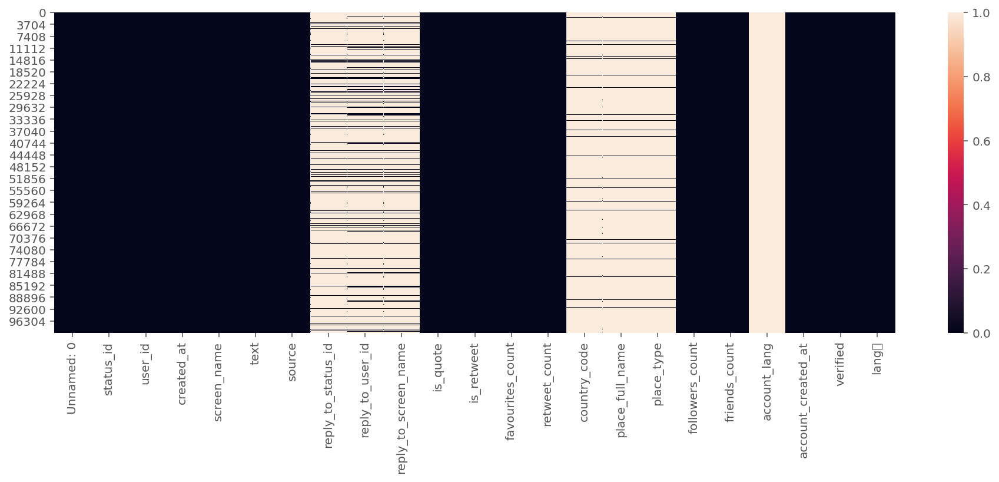

In [6]:
plt.figure(figsize = (16,5))
sns.heatmap(april_df.isnull())

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

def return_missing_values(data_frame):
    missing_values = data_frame.isnull().sum()/len(data_frame)
    missing_values = missing_values[missing_values>0]
    missing_values.sort_values(inplace=True)
    return missing_values

def plot_missing_values(data_frame):
    missing_values = return_missing_values(data_frame)
    missing_values = missing_values.to_frame()
    missing_values.columns = ['Precentage']
    missing_values.index.names = ['Name']
    missing_values['Name'] = missing_values.index
    sns.set(style='whitegrid', color_codes=True)
    sns.barplot(x='Name', y='Precentage', data=missing_values)
    plt.xticks(rotation=90)
    plt.show()

In [8]:
return_missing_values(april_df)

source                  0.00001
reply_to_user_id        0.85413
reply_to_screen_name    0.85413
reply_to_status_id      0.87970
place_full_name         0.95580
place_type              0.95580
country_code            0.95591
account_lang            1.00000
dtype: float64

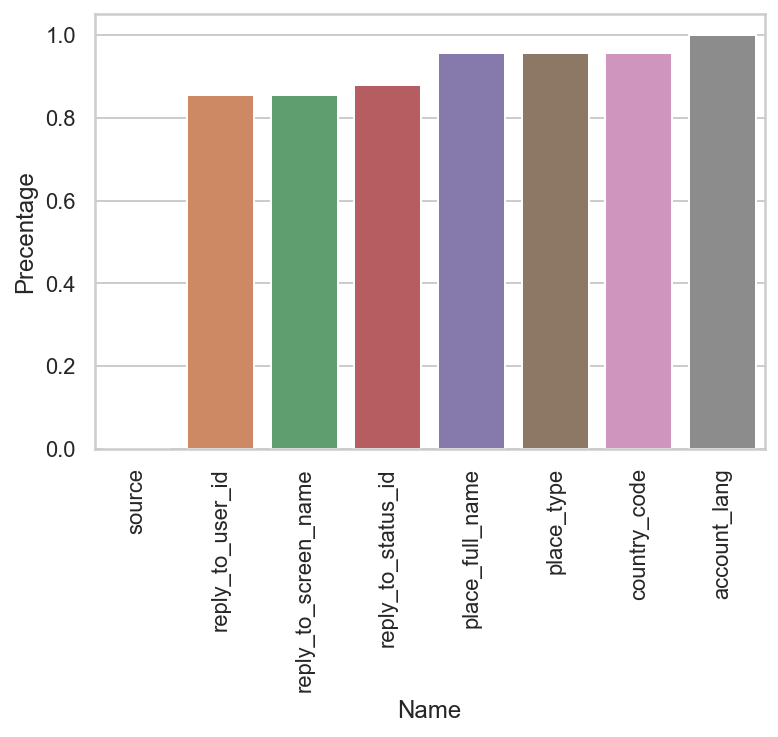

In [9]:
plot_missing_values(april_df)

In [10]:
april_df.corr()

,Unnamed: 0,status_id,user_id,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,account_lang,verified
Unnamed: 0,1.000000,0.997695,0.003004,-0.002697,0.010767,-0.022905,NaN,-0.044427,-0.015447,-0.002615,-0.030600,NaN,0.023470
status_id,0.997695,1.000000,0.003985,-0.003803,0.010222,-0.023567,NaN,-0.045056,-0.015320,-0.001687,-0.031139,NaN,0.024129
user_id,0.003004,0.003985,1.000000,0.010891,0.345398,-0.023180,NaN,-0.106304,-0.014931,-0.090203,-0.086783,NaN,-0.197060
reply_to_status_id,-0.002697,-0.003803,0.010891,1.000000,0.006212,-0.006203,NaN,-0.001681,0.003485,0.007508,0.000678,NaN,0.014318
reply_to_user_id,0.010767,0.010222,0.345398,0.006212,1.000000,-0.028801,NaN,-0.021493,-0.003885,-0.058669,-0.017491,NaN,-0.081749
is_quote,-0.022905,-0.023567,-0.023180,-0.006203,-0.028801,1.000000,NaN,0.080885,-0.008576,-0.038629,0.000798,NaN,-0.064519
is_retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
favourites_count,-0.044427,-0.045056,-0.106304,-0.001681,-0.021493,0.080885,NaN,1.000000,0.011799,-0.022181,0.177879,NaN,-0.051785
retweet_count,-0.015447,-0.015320,-0.014931,0.003485,-0.003885,-0.008576,NaN,0.011799,1.000000,0.078674,0.017856,NaN,0.097394
followers_count,-0.002615,-0.001687,-0.090203,0.007508,-0.058669,-0.038629,NaN,-0.022181,0.078674,1.000000,0.014487,NaN,0.335198


Text(0.5, 1.0, 'Correlation Heatmap')

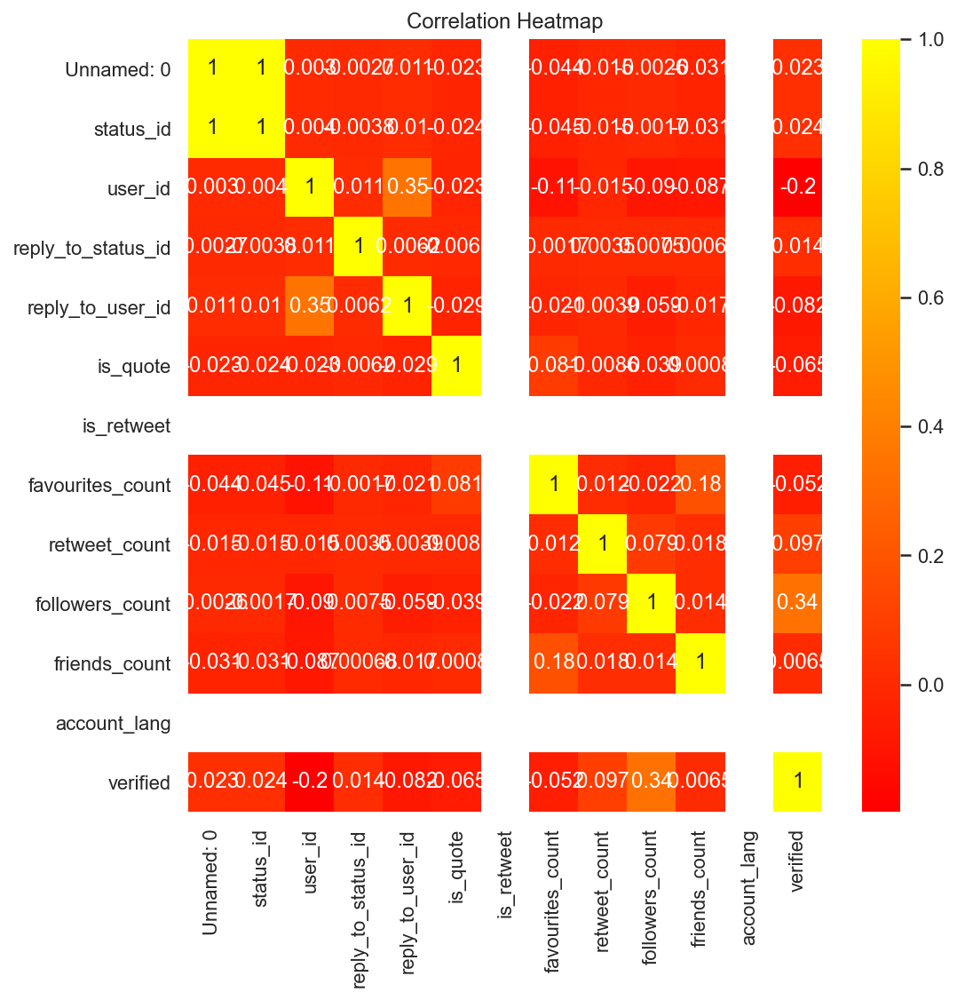

In [11]:
plt.figure(figsize=(8,8))
sns.heatmap(april_df.corr(), annot=True, cmap="autumn").set_title('Correlation Heatmap')

In [12]:
april_df = april_df.rename(columns={'screen_name': 'user_name'})

In [13]:
df_new = april_df['user_name'].value_counts().reset_index()
df_new.columns = ['user_name', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="user_name", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [14]:
df_new.tail(5)

,user_name,tweets_count
4,ThaiPBSNews,62
3,ANCALERTS,72
2,Devendr25548299,80
1,GlobalPandemics,116
0,TomthunkitsMind,153


In [15]:
april_df= pd.merge(april_df, df_new, on='user_name')

In [16]:
april_df.head(5)

,Unnamed: 0,status_id,user_id,created_at,user_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang\r,tweets_count
0,0,1255285670781878275,1244488571026690048,2020-04-29T00:00:00Z,NikoledMX,Las solicitudes de hospitales y otras organiza...,TweetDeck,NaN,NaN,NaN,...,NaN,NaN,NaN,3,25,NaN,2020-03-30T04:56:21Z,False,es\r,1
1,1,1255285670182113282,817072420947247104,2020-04-29T00:00:00Z,Tu_IMSS_Coah,Prepara tu propio gel antibacterial es fácil ...,TweetDeck,NaN,NaN,NaN,...,NaN,NaN,NaN,1710,169,NaN,2017-01-05T18:17:00Z,False,es\r,4
2,12866,1255300894729678849,817072420947247104,2020-04-29T01:00:30Z,Tu_IMSS_Coah,"Si empezaste a trabajar, registra ante el #IMS...",TweetDeck,NaN,NaN,NaN,...,NaN,NaN,NaN,1710,169,NaN,2017-01-05T18:17:00Z,False,es\r,4
3,23839,1255315868013248512,817072420947247104,2020-04-29T02:00:00Z,Tu_IMSS_Coah,Conoce los factores que propician el contagio ...,TweetDeck,NaN,NaN,NaN,...,NaN,NaN,NaN,1710,169,NaN,2017-01-05T18:17:00Z,False,es\r,4
4,34052,1255330969105698817,817072420947247104,2020-04-29T03:00:00Z,Tu_IMSS_Coah,Conoce las reglas de etiqueta para prevenir el...,TweetDeck,NaN,NaN,NaN,...,NaN,NaN,NaN,1710,169,NaN,2017-01-05T18:17:00Z,False,es\r,4


In [17]:
april_df = april_df.rename(columns={'followers_count': 'user_followers'})

In [18]:
data = april_df.sort_values('user_followers', ascending=False)
data = data.drop_duplicates(subset='user_name', keep="first")
data = data[['user_name', 'user_followers', 'tweets_count']]
data = data.sort_values('user_followers')

fig = px.bar(
    data.tail(20), 
    x="user_followers", 
    y="user_name", 
    color='tweets_count',
    orientation='h', 
    title='Top 20 users by number of followers', 
    width=800, 
    height=800
)

fig.show()

In [19]:
data.tail(5)

,user_name,user_followers,tweets_count
35356,timesofindia,12728697,23
14402,ndtv,12790312,28
10185,CGTNOfficial,14005421,15
43351,detikcom,15939386,7
5812,CNNEE,18581878,1


In [20]:
april_df = april_df.rename(columns={'account_created_at': 'user_created'})

In [21]:
april_df['user_created'] = pd.to_datetime(april_df['user_created'])
april_df['year_created'] = april_df['user_created'].dt.year
data = april_df.drop_duplicates(subset='user_name', keep="first")
data = data[data['year_created']>1970]
data = data['year_created'].value_counts().reset_index()
data.columns = ['year', 'number']

fig = px.bar(
    data, 
    x="year", 
    y="number", 
    orientation='v', 
    title='User created year by year', 
    width=800, 
    height=600
)

fig.show()

In [22]:
data.head()

,year,number
0,2009,8942
1,2020,6919
2,2011,6886
3,2019,6625
4,2010,6465


In [23]:
april_df = april_df.rename(columns={'country_code': 'user_location'})

In [24]:
ds = april_df['user_location'].value_counts().reset_index()
ds.columns = ['user_location', 'count']
ds = ds[ds['user_location']!='NA']
ds = ds.sort_values(['count'])

fig = px.bar(
    ds.tail(20), 
    x="count", 
    y="user_location", 
    orientation='h', title='Top 20 user locations by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [25]:
ds.head()

,user_location,count
115,GM,1
89,BH,1
90,MM,1
91,SC,1
92,MU,1


In [26]:
def pie_count(data, field, percent_limit, title):
    
    data[field] = data[field].fillna('NA')
    data = data[field].value_counts().to_frame()

    total = data[field].sum()
    data['percentage'] = 100 * data[field]/total    

    percent_limit = percent_limit
    otherdata = data[data['percentage'] < percent_limit] 
    others = otherdata['percentage'].sum()  
    maindata = data[data['percentage'] >= percent_limit]

    data = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    data.loc[other_label] = pd.Series({field:otherdata[field].sum()}) 
    
    labels = data.index.tolist()   
    datavals = data[field].tolist()
    
    trace=go.Pie(labels=labels,values=datavals)

    layout = go.Layout(
        title = title,
        height=600,
        width=600
        )
    
    fig = go.Figure(data=[trace], layout=layout)
    iplot(fig)
    
pie_count(april_df, 'user_location', 0.5, 'Number of tweets per location')

In [27]:
from string import punctuation
from nltk.corpus import stopwords
print(stopwords.words('english')[10:15])

def punctuation_stopwords_removal(sms):
    # filters charecter-by-charecter : ['h', 'e', 'e', 'l', 'o', 'o', ' ', 'm', 'y', ' ', 'n', 'a', 'm', 'e', ' ', 'i', 's', ' ', 'p', 'u', 'r', 'v', 'a']
    remove_punctuation = [ch for ch in sms if ch not in punctuation]
    # convert them back to sentences and split into words
    remove_punctuation = "".join(remove_punctuation).split()
    filtered_sms = [word.lower() for word in remove_punctuation if word.lower() not in stopwords.words('english')]
    return filtered_sms

["you've", "you'll", "you'd", 'your', 'yours']


In [28]:
from wordcloud import WordCloud, STOPWORDS


def draw_word_cloud(df, location, title):
    loc_df = df.loc[df.user_location==location]
    loc_df.loc[:, 'text'] = loc_df['text'].apply(punctuation_stopwords_removal)
    word_cloud = WordCloud(
                    background_color='black',
                    stopwords=set(STOPWORDS),
                    max_words=100,
                    max_font_size=50,
                    scale=5,
                    random_state=1).generate(str(loc_df['text']))
    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    plt.imshow(word_cloud)
    plt.show() 

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



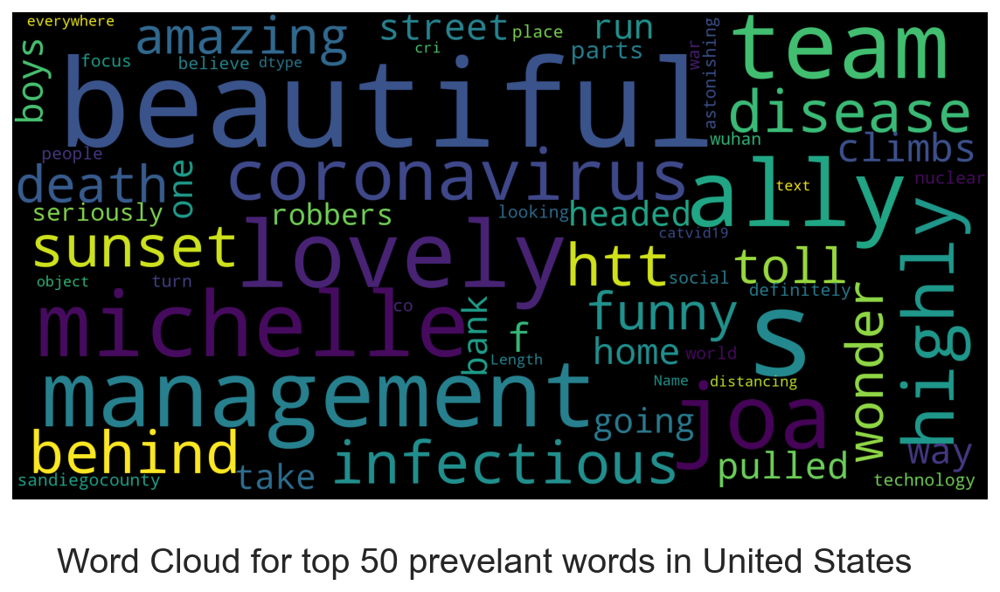

In [29]:
draw_word_cloud(april_df, 'US', 'Word Cloud for top 50 prevelant words in United States')

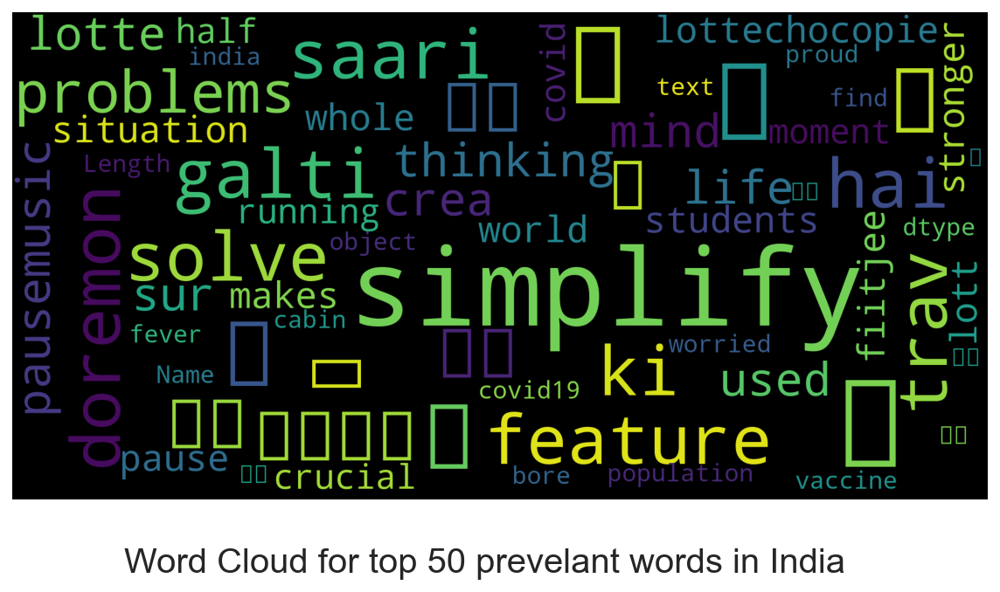

In [30]:
draw_word_cloud(april_df, 'IN', 'Word Cloud for top 50 prevelant words in India')

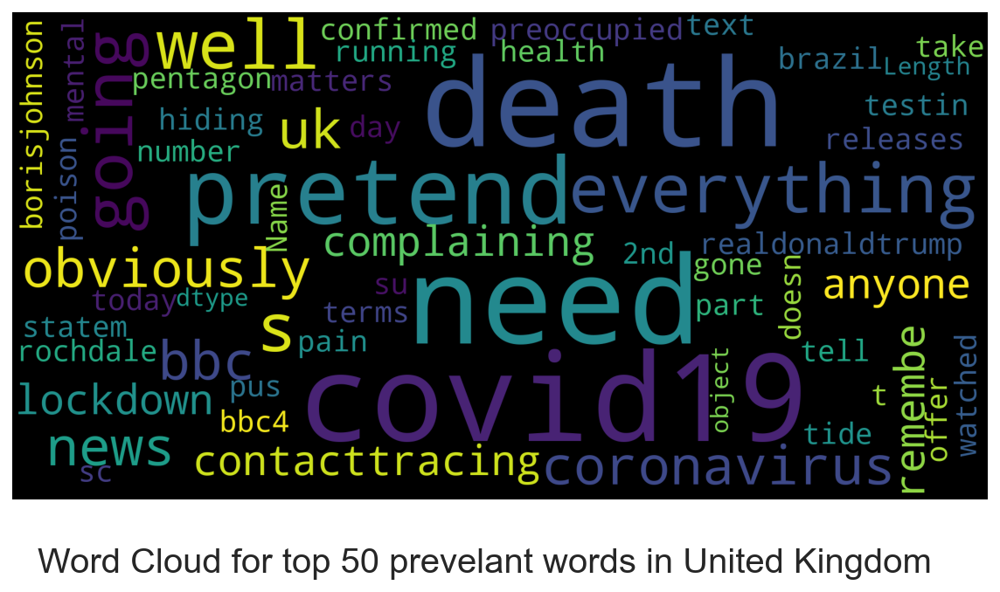

In [31]:
draw_word_cloud(april_df, 'GB', 'Word Cloud for top 50 prevelant words in United Kingdom')

In [32]:
#Just split day and time into separate columns

april_df['date'] = pd.to_datetime(april_df['created_at']) 
april_df = april_df.sort_values(['date'])
april_df['day'] = april_df['date'].astype(str).str.split(' ', expand=True)[0]
april_df['time'] = april_df['date'].astype(str).str.split(' ', expand=True)[1]
april_df.head()

,Unnamed: 0,status_id,user_id,created_at,user_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,friends_count,account_lang,user_created,verified,lang\r,tweets_count,year_created,date,day,time
0,0,1255285670781878275,1244488571026690048,2020-04-29T00:00:00Z,NikoledMX,Las solicitudes de hospitales y otras organiza...,TweetDeck,NaN,NaN,NaN,...,25,NaN,2020-03-30 04:56:21+00:00,False,es\r,1,2020,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00
176,31,1255285671117324291,913732650627665920,2020-04-29T00:00:00Z,InfoMdpya,General Alvarado autoriza esparcimiento de 13 ...,Twitter for Advertisers,NaN,NaN,NaN,...,3666,NaN,2017-09-29 11:50:15+00:00,False,es\r,16,2017,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00
192,32,1255285670786019332,1243253660932386817,2020-04-29T00:00:00Z,TeziuCast,Tensiones entre pobladores de #Xiutetelco y au...,TweetDeck,NaN,NaN,NaN,...,61,NaN,2020-03-26 19:09:18+00:00,False,es\r,5,2020,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00
197,33,1255285670765121538,2914458737,2020-04-29T00:00:00Z,milexy_garces,Yo me imagino que cuando todo esto acabe y abr...,Twitter for iPhone,NaN,NaN,NaN,...,80,NaN,2014-12-10 21:30:45+00:00,False,es\r,1,2014,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00
198,34,1255285670672846849,54129406,2020-04-29T00:00:00Z,donCmontgomery,B.C. real estate faces COVID-19 #slump. But ho...,TweetDeck,NaN,NaN,NaN,...,2255,NaN,2009-07-06 05:44:27+00:00,False,en\r,1,2009,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00


In [33]:
april_df['hour'] = april_df['date'].dt.hour
ds = april_df['hour'].value_counts().reset_index()
ds.columns = ['hour', 'count']
ds['hour'] = 'Hour ' + ds['hour'].astype(str)
fig = px.bar(
    ds, 
    x="hour", 
    y="count", 
    orientation='v', 
    title='Tweets distribution over hours', 
    width=800
)
fig.show()

In [34]:
april_df.head(3)

,Unnamed: 0,status_id,user_id,created_at,user_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,account_lang,user_created,verified,lang\r,tweets_count,year_created,date,day,time,hour
0,0,1255285670781878275,1244488571026690048,2020-04-29T00:00:00Z,NikoledMX,Las solicitudes de hospitales y otras organiza...,TweetDeck,NaN,NaN,NaN,...,NaN,2020-03-30 04:56:21+00:00,False,es\r,1,2020,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00,0
176,31,1255285671117324291,913732650627665920,2020-04-29T00:00:00Z,InfoMdpya,General Alvarado autoriza esparcimiento de 13 ...,Twitter for Advertisers,NaN,NaN,NaN,...,NaN,2017-09-29 11:50:15+00:00,False,es\r,16,2017,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00,0
192,32,1255285670786019332,1243253660932386817,2020-04-29T00:00:00Z,TeziuCast,Tensiones entre pobladores de #Xiutetelco y au...,TweetDeck,NaN,NaN,NaN,...,NaN,2020-03-26 19:09:18+00:00,False,es\r,5,2020,2020-04-29 00:00:00+00:00,2020-04-29,00:00:00+00:00,0


In [35]:
april_df.drop(['Unnamed: 0','status_id','user_id','user_location','source','reply_to_status_id','reply_to_user_id','user_created','reply_to_screen_name','account_lang','user_created','verified','user_followers','date','hour','created_at','is_quote','is_retweet','favourites_count','retweet_count','place_type','friends_count','year_created','place_full_name'], axis = 1, inplace = True)
april_df.drop_duplicates()
april_df.head(2)

,user_name,text,lang\r,tweets_count,day,time
0,NikoledMX,Las solicitudes de hospitales y otras organiza...,es\r,1,2020-04-29,00:00:00+00:00
176,InfoMdpya,General Alvarado autoriza esparcimiento de 13 ...,es\r,16,2020-04-29,00:00:00+00:00


In [36]:
april_df = april_df.rename(columns={'text': 'tweet', 'day': 'date'})
april_df.head()

,user_name,tweet,lang\r,tweets_count,date,time
0,NikoledMX,Las solicitudes de hospitales y otras organiza...,es\r,1,2020-04-29,00:00:00+00:00
176,InfoMdpya,General Alvarado autoriza esparcimiento de 13 ...,es\r,16,2020-04-29,00:00:00+00:00
192,TeziuCast,Tensiones entre pobladores de #Xiutetelco y au...,es\r,5,2020-04-29,00:00:00+00:00
197,milexy_garces,Yo me imagino que cuando todo esto acabe y abr...,es\r,1,2020-04-29,00:00:00+00:00
198,donCmontgomery,B.C. real estate faces COVID-19 #slump. But ho...,en\r,1,2020-04-29,00:00:00+00:00


In [37]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

april_df = april_df.sample(frac=1).reset_index(drop=True)
april_df.head()

,user_name,tweet,lang\r,tweets_count,date,time
0,reddys_mohan,# కోవిడ్ -19 నివారణ చర్యలపై అధికారులతో ఉన్నత స...,te\r,1,2020-04-29,02:35:50+00:00
1,PhotoFruge,Although we should be neck deep in basketball ...,en\r,1,2020-04-29,00:24:31+00:00
2,HealthcareBeat,BioNTech and Pfizer announce completion of dos...,en\r,7,2020-04-29,08:13:06+00:00
3,FukerJussan,#SOSAmazonas #coronavirus #COVID19\n\n@AlexLop...,es\r,5,2020-04-29,00:55:16+00:00
4,nnyc,.@Lawrence exactly: you can make eye contact w...,en\r,1,2020-04-29,02:11:58+00:00


In [38]:
april_df = april_df[april_df['lang\r'] == 'en\r']
april_df.head()

,user_name,tweet,lang\r,tweets_count,date,time
1,PhotoFruge,Although we should be neck deep in basketball ...,en\r,1,2020-04-29,00:24:31+00:00
2,HealthcareBeat,BioNTech and Pfizer announce completion of dos...,en\r,7,2020-04-29,08:13:06+00:00
4,nnyc,.@Lawrence exactly: you can make eye contact w...,en\r,1,2020-04-29,02:11:58+00:00
5,Cal_Engineer,. @BerkeleyBioE professor @pdhsu helped lead a...,en\r,1,2020-04-29,01:36:54+00:00
6,Agikunda,Its so wrong for #JKIA to get the passes of po...,en\r,1,2020-04-29,06:24:26+00:00


In [39]:
april_df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54850 entries, 1 to 99998
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   user_name     54850 non-null  object
 1   tweet         54850 non-null  object
         54850 non-null  object
 3   tweets_count  54850 non-null  int64 
 4   date          54850 non-null  object
 5   time          54850 non-null  object
dtypes: int64(1), object(5)
memory usage: 2.9+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [40]:
april_df = pd.concat([april_df], ignore_index=True)

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [42]:
df_new = april_df[april_df['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

             user_name                                              tweet  \
0           PhotoFruge  Although we should be neck deep in basketball ...   
1       HealthcareBeat  BioNTech and Pfizer announce completion of dos...   
2                 nnyc  .@Lawrence exactly: you can make eye contact w...   
3         Cal_Engineer  . @BerkeleyBioE professor @pdhsu helped lead a...   
4             Agikunda  Its so wrong for #JKIA to get the passes of po...   
...                ...                                                ...   
54845       ahoyitsfoy  Here's my latest bit of #data processing - if ...   
54846  _brainvelocity_  The United Nations is right now the "Vibhishan...   
54847        besatweet  BESA members @CambridgeInt @OUPAcademic @Pears...   
54848  PattayaNewsFlas  Believe it or not:\n\nThese are the facts abou...   
54849      ACSouthAsia  The loan has been sanctioned to support immedi...   

      lang\r  tweets_count        date            time  \
0       en\r     

In [43]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''
#All the lexical features were rated for the polarity and intensity on a scale from “-4: Extremely Negative” to “+4 Extremely Positive


from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

new_words = {
    'positive covid': -3.0,
    'positive cases': -3.0,
    'tested positive': -3.0,
    'tests positive': -3.0,
}

analyser = SentimentIntensityAnalyzer()
analyser.lexicon.update(new_words)

scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [44]:
df_new.head()

,user_name,tweet,lang\r,tweets_count,date,time,text,sentiment
0,PhotoFruge,Although we should be neck deep in basketball ...,en\r,1,2020-04-29,00:24:31+00:00,although neck deep basketball right now scotts...,Positive
1,HealthcareBeat,BioNTech and Pfizer announce completion of dos...,en\r,7,2020-04-29,08:13:06+00:00,biontech pfizer announce completion dosing fir...,Neutral
2,nnyc,.@Lawrence exactly: you can make eye contact w...,en\r,1,2020-04-29,02:11:58+00:00,lawrence exactly make eye contact w mayoclinic...,Positive
3,Cal_Engineer,. @BerkeleyBioE professor @pdhsu helped lead a...,en\r,1,2020-04-29,01:36:54+00:00,berkeleybioe professor pdhsu helped lead major...,Positive
4,Agikunda,Its so wrong for #JKIA to get the passes of po...,en\r,1,2020-04-29,06:24:26+00:00,its wrong jkia get passes poor workers night c...,Negative


(-0.5, 399.5, 199.5, -0.5)

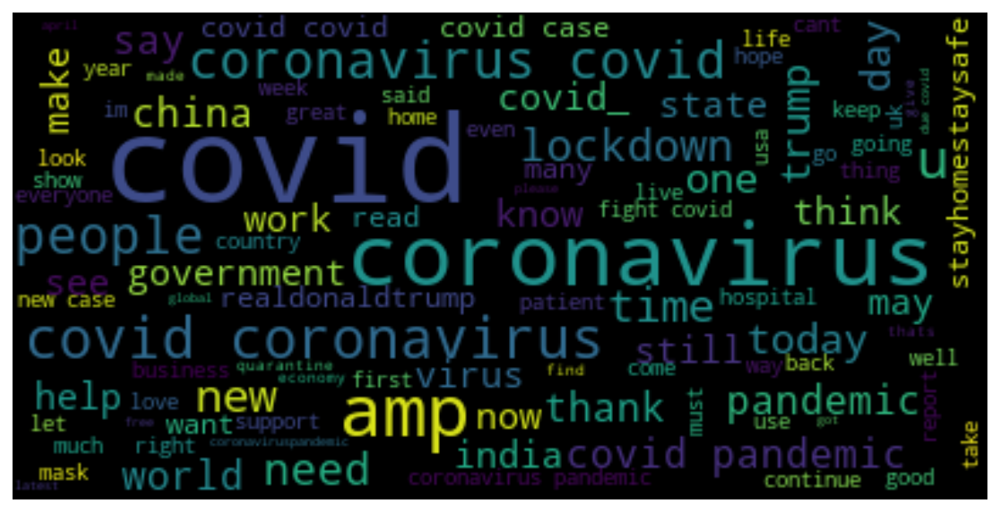

In [45]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [46]:
df_new['text']

0        although neck deep basketball right now scotts...
1        biontech pfizer announce completion dosing fir...
2        lawrence exactly make eye contact w mayoclinic...
3        berkeleybioe professor pdhsu helped lead major...
4        its wrong jkia get passes poor workers night c...
                               ...                        
54845    heres latest bit data processing assume equal ...
54846    the united nations right vibhishan world its q...
54847    besa members cambridgeint oupacademic pearsons...
54848    believe not these facts covid coronavirus cris...
54849    the loan sanctioned support immediate prioriti...
Name: text, Length: 54850, dtype: object

In [47]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,24576
0,Negative,17441
1,Neutral,12833


<AxesSubplot:xlabel='sentiment', ylabel='count'>

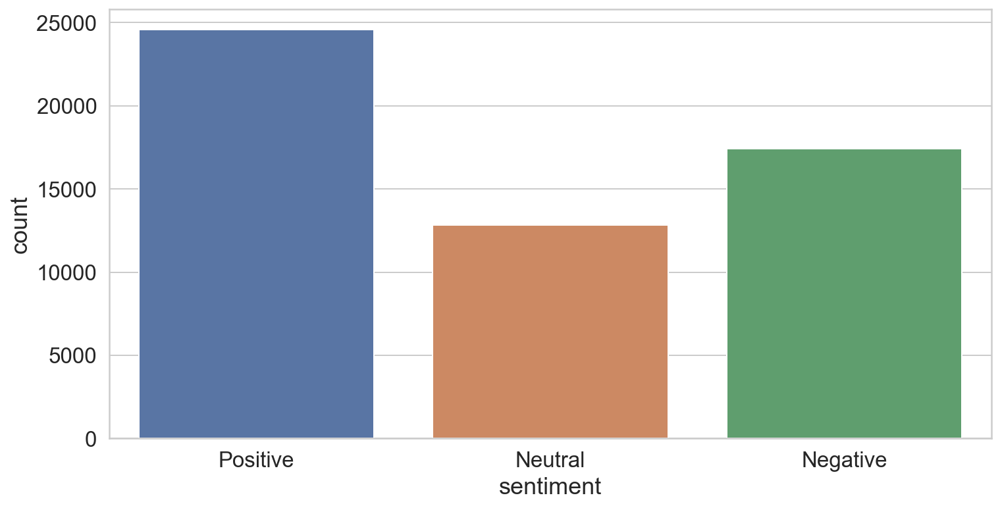

In [48]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [49]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

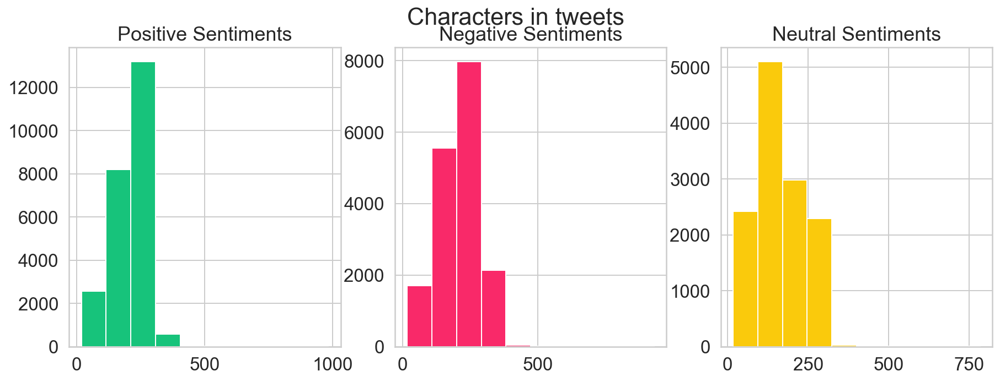

In [50]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

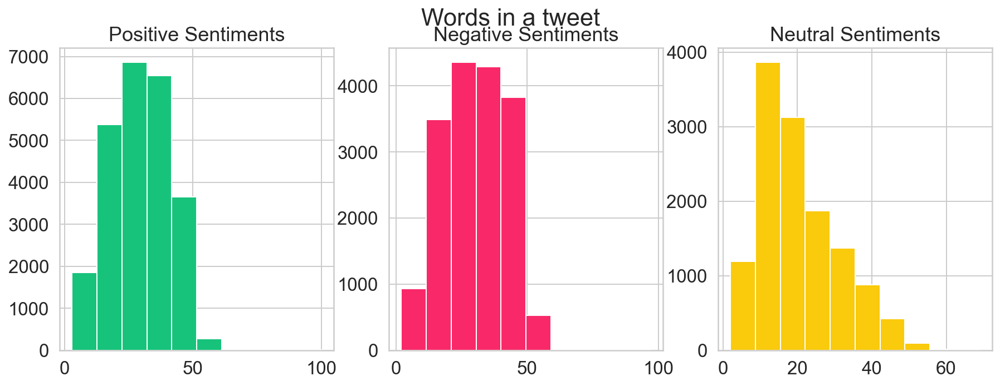

In [51]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

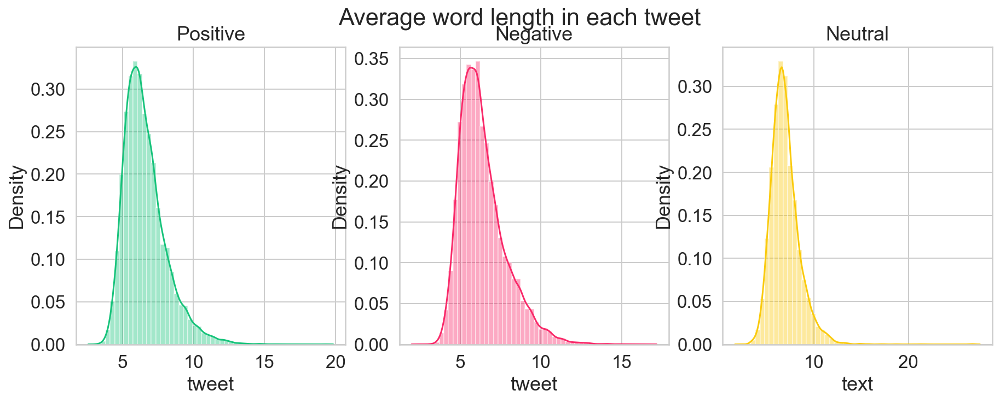

In [52]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [53]:
np.array(stopwords)

array({'before', "weren't", 'more', 'by', 'how', 'ours', 'being', 'same', 'o', "you've", 'be', 'for', 'where', 'won', 'after', 'was', "needn't", 'each', 'during', 'at', 'above', 'the', 'very', 'below', 'in', 'to', 'which', "don't", 'don', 'there', 'doesn', 'from', 'what', 're', 'nor', 'about', 'once', 'itself', "you'd", "shouldn't", 'have', 'and', 'me', 'of', "that'll", 'when', 'it', 'been', "doesn't", "hadn't", 'her', 'has', 'wasn', 'other', "wasn't", 'here', 'were', "it's", 'off', 'hasn', 'yours', 'who', 'do', 'both', 'theirs', "should've", 'a', 'against', 'his', 't', 'him', 'all', 's', 'or', 'ourselves', 'own', 'yourself', 'if', 'isn', 'am', 'y', "aren't", 'again', 'should', 'needn', 'hadn', 'through', 'whom', "shan't", 'ma', "isn't", "you'll", 'too', 'under', 'so', "couldn't", "didn't", 'only', 'our', 'doing', 'does', 'no', 'not', 'now', 'themselves', 'its', 'we', 'wouldn', 'them', "haven't", 'm', 'mightn', "mustn't", "she's", 'up', 'my', 'any', 'these', 'just', 'i', 'those', 'whil

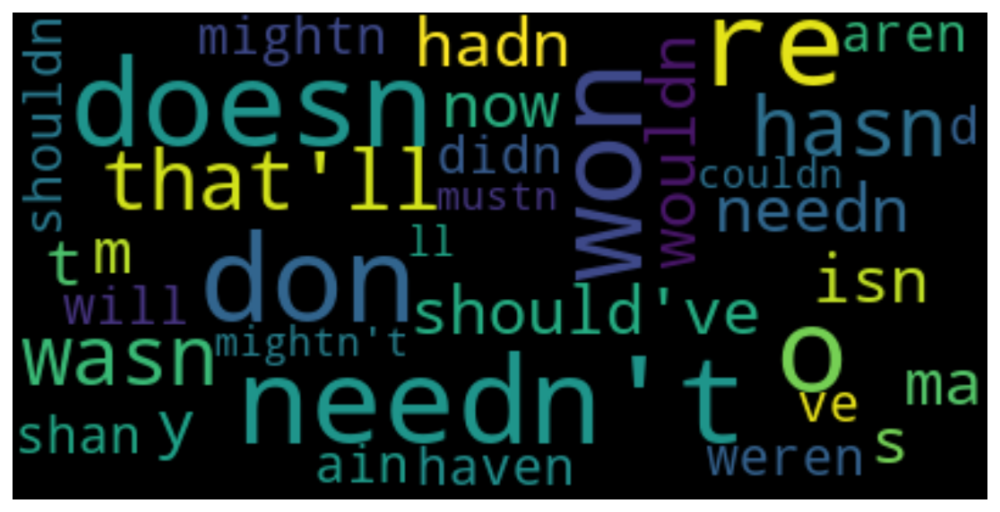

In [54]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 

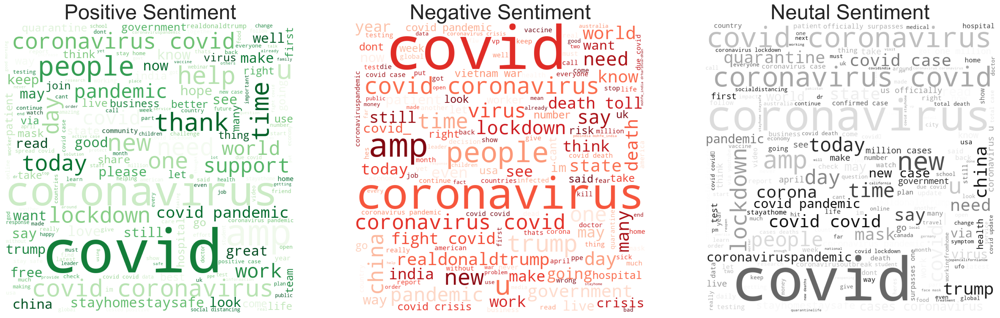

In [55]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [56]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

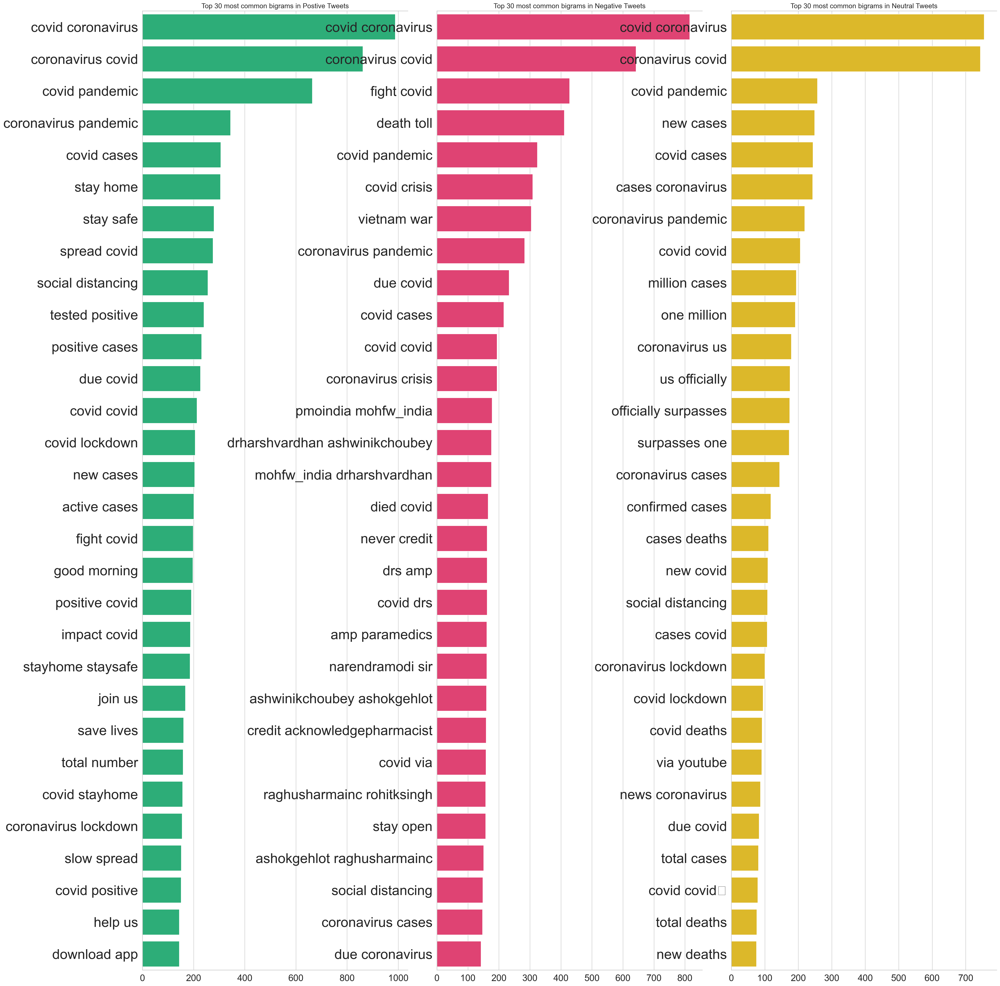

In [57]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

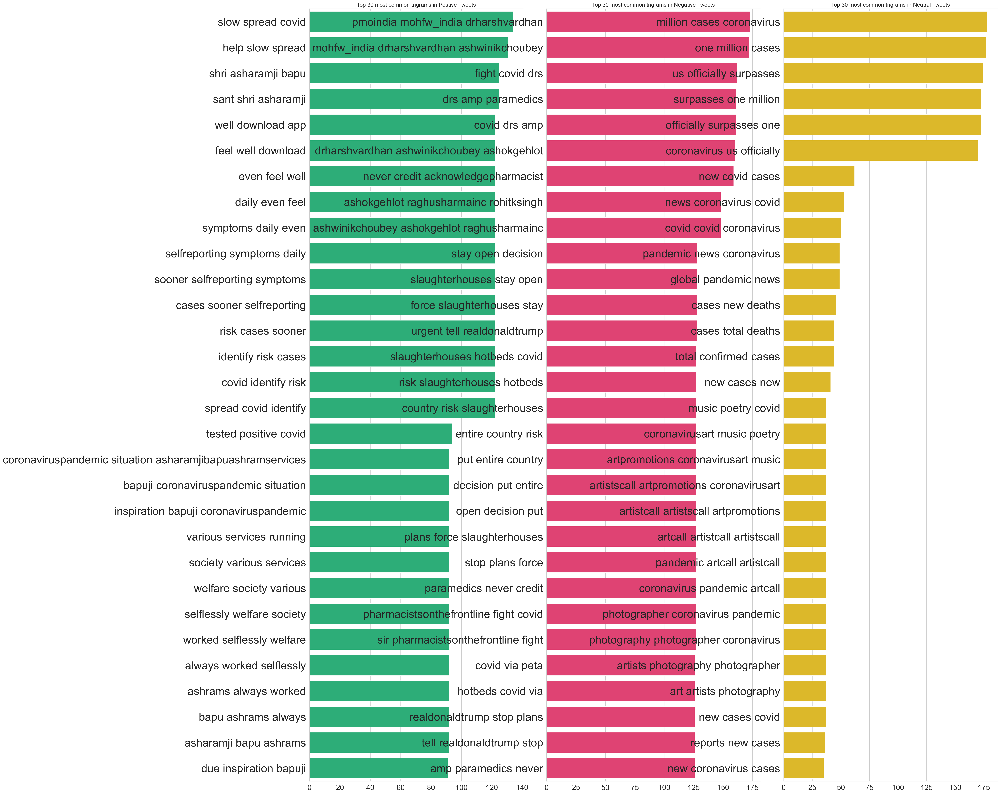

In [58]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [59]:
df_new.head()

,user_name,tweet,lang\r,tweets_count,date,time,text,sentiment
0,PhotoFruge,Although we should be neck deep in basketball ...,en\r,1,2020-04-29,00:24:31+00:00,although neck deep basketball right now scotts...,Positive
1,HealthcareBeat,BioNTech and Pfizer announce completion of dos...,en\r,7,2020-04-29,08:13:06+00:00,biontech pfizer announce completion dosing fir...,Neutral
2,nnyc,.@Lawrence exactly: you can make eye contact w...,en\r,1,2020-04-29,02:11:58+00:00,lawrence exactly make eye contact w mayoclinic...,Positive
3,Cal_Engineer,. @BerkeleyBioE professor @pdhsu helped lead a...,en\r,1,2020-04-29,01:36:54+00:00,berkeleybioe professor pdhsu helped lead major...,Positive
4,Agikunda,Its so wrong for #JKIA to get the passes of po...,en\r,1,2020-04-29,06:24:26+00:00,its wrong jkia get passes poor workers night c...,Negative


In [60]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [61]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,user_name,tweet,lang\r,tweets_count,date,time,text,sentiment
0,_FinancialWorld,Kuroda says took 'rare' step by offering to pa...,en\r,7,2020-04-29,08:13:43+00:00,kuroda says took rare step offering pay banks ...,Positive
1,mrpalkar,If you or any seafarers you know who are going...,en\r,1,2020-04-29,06:22:49+00:00,if seafarers know going sign indian port pleas...,Positive
2,gops33,How Tableeghi Jamaat Members In India Are Bein...,en\r,3,2020-04-29,04:08:55+00:00,how tableeghi jamaat members in india are bein...,Neutral
3,langstonwertzjr,"With the state basketball finals canceled, sho...",en\r,4,2020-04-29,04:00:30+00:00,with state basketball finals canceled north ca...,Positive
4,ByClare,"NMHC chief Christine Morgan says ""random acts ...",en\r,5,2020-04-29,02:13:34+00:00,nmhc chief christine morgan says random acts k...,Positive


In [62]:
print(df_new)

             user_name                                              tweet  \
0      _FinancialWorld  Kuroda says took 'rare' step by offering to pa...   
1             mrpalkar  If you or any seafarers you know who are going...   
2               gops33  How Tableeghi Jamaat Members In India Are Bein...   
3      langstonwertzjr  With the state basketball finals canceled, sho...   
4              ByClare  NMHC chief Christine Morgan says "random acts ...   
...                ...                                                ...   
50430        FanzoMash  Yhoo😂😂\n\nRegrets regrets regrets !!!!!!!!!!!!...   
50431    PVenkatGandhi  This is the Priority of India's FM during #Cov...   
50432       mstrofbass  Broke: #Coronavirus was developed in a Chinese...   
50433  DrPaulaWhiteman  Now @MayoClinic has lost credibility. Stating ...   
50434       _ZooMarch_  Unlock the power of creativity: fight #covid19...   

      lang\r  tweets_count        date            time  \
0       en\r     

In [63]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [64]:
len(df_new_final)

40000

In [65]:
export_csv = df_new_final.to_csv(r'covid19 april tweets.csv')